<a href="https://colab.research.google.com/github/donguk071/DL_practice/blob/main/music_generator_upgrade.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Copyright 2022 MIT 6.S191 Introduction to Deep Learning. All Rights Reserved.
# 
# Licensed under the MIT License. You may not use this file except in compliance
# with the License. Use and/or modification of this code outside of 6.S191 must
# reference:
#
# © MIT 6.S191: Introduction to Deep Learning
# http://introtodeeplearning.com

In [ ]:
# Import Tensorflow 2.0
%tensorflow_version 2.x
import tensorflow as tf 

# Download and import the MIT 6.S191 package
!pip install mitdeeplearning
import mitdeeplearning as mdl

# Import all remaining packages
import numpy as np
import os
import time
import functools
from IPython import display as ipythondisplay
from tqdm import tqdm
!apt-get install abcmidi timidity > /dev/null 2>&1

# Check that we are using a GPU, if not switch runtimes
#   using Runtime > Change Runtime Type > GPU
assert len(tf.config.list_physical_devices('GPU')) > 0

     |████████████████████████████████| 2.1 MB 5.9 MB/s 
  Created wheel for mitdeeplearning: filename=mitdeeplearning-0.2.0-py3-none-any.whl size=2115442 sha256=7e13351e4eadd679e0876e0eccbb917b51000f7f89030f00a1afd5c0efb5fcd5
  Stored in directory: /root/.cache/pip/wheels/9a/b9/4f/99b7c8c5c75355550b83e1fcfc02956fb40c35eb01e2262877
Successfully built mitdeeplearning


AssertionError: ignored

In [ ]:
# Download the dataset
# dataset은 mit에서 제공
songs = mdl.lab1.load_training_data()

# Print one of the songs to inspect it in greater detail!
example_song = songs[0]
print("\nExample song: ")
'''
for i in range(len(songs)):
    print(songs[i])              #idea1 : 전처리 과정에서 X 부분 , T 부분 , Z 부분을 추가로 전처리 한다  
'''
print(songs[23])
print(songs[630])

del songs[23]
del songs[629]

NameError: ignored

In [ ]:
print(songs[629])

X:299
T:Raheen
Z: id:dc-reel-277
M:C
L:1/8
K:G Major
B|d3e dBGA|B3G AGEG|d3e dBGA|BAGB A3c|!
Bdd2 e2dB|d3B AGEG|B3G AGEG|DGGF G3:|!
A|Bdd2 cee2|d3e dBGA|Bdd2 edd2|gedB A3c|!
BGBd e2dB|d3B AGEG|B3G AGEG|DGGF G3:|!


In [ ]:
#print(songs[0])

for i in range(815):
    a = 0 
    b = 0
    for _ in songs[i]:
        if _ == '\n':
            a += 1
            b += 1
            if a == 5:
                break 
        else: b += 1
    songs[i] = songs[i][b:]

#print(songs[1][b:])
#print()

In [ ]:
print(songs[4])

K:A Dorian
ed|cAAB cBcd|eaaf gedB|c2Ac B2Bc|d2de dBGB|!
AGAB cBcd|eaaf gedB|cAAc dBGB|BAAG A2:|!
cd|eaab aged|eaab aged|egga gedB|egga gedB|!
AGAB cBcd|eaaf gedB|cAAc dBGB|BAAG A2:|!


In [ ]:
a = 0
for i in songs:
    a += len(i)
print(a/len(songs))

191.9680981595092


In [ ]:
# Convert the ABC notation to audio file and listen to it
mdl.lab1.play_song(songs[1])
# 위 ABC notation을 다시 노래로 바꿔 준다

In [ ]:
# Join our list of song strings into a single string containing all songs
songs_joined = "\n\n".join(songs) 
#모든 노래를 하나의 string 으로 결합? 

# Find all unique characters in the joined string
vocab = sorted(set(songs_joined)) # unqie 한 정보로 뽑기 총 83가지 경우가 있다
print("There are", len(vocab), "unique characters in the dataset")

There are 60 unique characters in the dataset


In [ ]:
print(songs_joined)

K:D Major
(3ABc|dAFA DFAd|fdcd FAdf|gfge fefd|(3efe (3dcB A2 (3ABc|!
dAFA DFAd|fdcd FAdf|gfge fefd|(3efe dc d2:|!
AG|FAdA FAdA|GBdB GBdB|Acec Acec|dfaf gecA|!
FAdA FAdA|GBdB GBdB|Aceg fefd|(3efe dc d2:|!

K:G Major
GF|DGGB d2GB|d2GF Gc (3AGF|DGGB d2GB|dBcA F2GF|!
DGGB d2GF|DGGF G2Ge|fgaf gbag|fdcA G2:|!
GA|B2BG c2cA|d2GF G2GA|B2BG c2cA|d2DE F2GA|!
B2BG c2cA|d^cde f2 (3def|g2gf gbag|fdcA G2:|!

K:D Major
ag|(3faf df AdFA|DFAd f2ef|gbec dfAF|GABG E2ag|!
(3faf df AdFA|DFAd f2ef|gbed cABc|d2f2 d2:|!
(3DEF|GFGA Bcde|fgfe dcdB|A2f2 fef2|G2e2 ede2|!
GFGA Bcde|fgfe dcdB|Afed cABc|d2f2 d2:|!
ag|(3fgf (3efe (3ded (3cdc|(3BcB (3ABA G2ba|(3gag (3fgf (3efe (3ded|(3cdc (3BcB A2ag|!
(3fgf (3efe (3ded (3cdc|(3BcB (3ABA (3GAG (3FGF|Eged cABc|d2f2 d2:|!

K:D Mixolydian
AG|F2FA GFD2|de (3fed d^cAF|G2GF GFDE|FdcA G2AG|!
F2FA GFD2|de (3fed d^cAG|AdcA GcAG|F2D2 D2:|!
fg|agfa gfeg|fd e^c d=cA2|agfa gfde|fdgf e2 fg|!
a2ge f3e|d^cde fdAG|AdcA GcAG|F2D2 D2:|!

K:A Dorian
ed|cAAB cBcd|eaaf gedB|c2Ac B2Bc|d2de dB

In [ ]:
### Define numerical representation of text ###

# Create a mapping from character to unique index.
# For example, to get the index of the character "d", 
#   we can evaluate `char2idx["d"]`.  
char2idx = {u:i for i, u in enumerate(vocab)} # table 부분 : 모든 case에 char에 대하여 mapping을 해준다 set >> list

# Create a mapping from indices to characters. This is
#   the inverse of char2idx and allows us to convert back
#   from unique index to the character in our vocabulary.
idx2char = np.array(vocab) # 위 에서 mapping한거 역추론하는 table 

In [ ]:
print(idx2char)
print(char2idx)

['\n' ' ' '!' '"' '#' "'" '(' ')' ',' '-' '/' '1' '2' '3' '4' '6' '8' '9'
 ':' '<' '=' '>' 'A' 'B' 'C' 'D' 'E' 'F' 'G' 'K' 'L' 'M' 'R' 'V' '[' ']'
 '^' '_' 'a' 'b' 'c' 'd' 'e' 'f' 'g' 'i' 'j' 'l' 'm' 'n' 'o' 'p' 'r' 's'
 't' 'u' 'x' 'y' 'z' '|']
{'\n': 0, ' ': 1, '!': 2, '"': 3, '#': 4, "'": 5, '(': 6, ')': 7, ',': 8, '-': 9, '/': 10, '1': 11, '2': 12, '3': 13, '4': 14, '6': 15, '8': 16, '9': 17, ':': 18, '<': 19, '=': 20, '>': 21, 'A': 22, 'B': 23, 'C': 24, 'D': 25, 'E': 26, 'F': 27, 'G': 28, 'K': 29, 'L': 30, 'M': 31, 'R': 32, 'V': 33, '[': 34, ']': 35, '^': 36, '_': 37, 'a': 38, 'b': 39, 'c': 40, 'd': 41, 'e': 42, 'f': 43, 'g': 44, 'i': 45, 'j': 46, 'l': 47, 'm': 48, 'n': 49, 'o': 50, 'p': 51, 'r': 52, 's': 53, 't': 54, 'u': 55, 'x': 56, 'y': 57, 'z': 58, '|': 59}


In [ ]:
# mapping 결과 확인 코드
# 난생 처음보는 for문 이런것도 가능하구나
print('{')
for char,_ in zip(char2idx, range(20)):
    print('  {:4s}: {:3d},'.format(repr(char), char2idx[char]))
print('  ...\n}')

{
  '\n':   0,
  ' ' :   1,
  '!' :   2,
  '"' :   3,
  '#' :   4,
  "'" :   5,
  '(' :   6,
  ')' :   7,
  ',' :   8,
  '-' :   9,
  '/' :  10,
  '1' :  11,
  '2' :  12,
  '3' :  13,
  '4' :  14,
  '6' :  15,
  '8' :  16,
  '9' :  17,
  ':' :  18,
  '<' :  19,
  ...
}


In [ ]:
### Vectorize the songs string ###

'''TODO: Write a function to convert the all songs string to a vectorized
    (i.e., numeric) representation. Use the appropriate mapping
    above to convert from vocab characters to the corresponding indices.

  NOTE: the output of the `vectorize_string` function 
  should be a np.array with `N` elements, where `N` is
  the number of characters in the input string
'''
def vectorize_string(string):
  vectorized_output = np.array([char2idx[char] for char in string])
  return vectorized_output

# 앞서 정의한 char2idx를 이용하여 앞서 하나의 string으로 만든 노래정보를 바꿔준다 abc notion >> int

vectorized_songs = vectorize_string(songs_joined)

In [ ]:
print(vectorized_songs.shape[0])

158082


In [ ]:
print ('{} ---- characters mapped to int ----> {}'.format(repr(songs_joined[:10]), vectorized_songs[:10]))
# check that vectorized_songs is a numpy array
# 변환 결과 일부 확인

assert isinstance(vectorized_songs, np.ndarray), "returned result should be a numpy array"

'K:D Major\n' ---- characters mapped to int ----> [29 18 25  1 31 38 46 50 52  0]


In [ ]:
### Batch definition to create training examples ###


#idea3 : 5개씩 예측하도록 만들어 볼까?

def get_batch(vectorized_songs, seq_length, batch_size):
  # the length of the vectorized songs string
  n = vectorized_songs.shape[0] - 1
  # randomly choose the starting indices for the examples in the training batch
  idx = np.random.choice(n-seq_length, batch_size) # 대략 2만 얼마에서 100이상수일 가능성 높음 그냥 범위 설정하고 복원추출
  #print(idx)
  '''TODO: construct a list of input sequences for the training batch'''
  input_batch = [vectorized_songs[i : i+seq_length] for i in idx] # 위에 설정한 범위에서 학습용으로 나눠주기
  # input_batch = # TODO
  '''TODO: construct a list of output sequences for the training batch'''
  output_batch = [vectorized_songs[i+1 : i+seq_length+1] for i in idx]
  # 위보다 하나씩 밀린걸 만들어서 target으로 잡는다(예측) 
  # output_batch = # TODO

  # x_batch, y_batch provide the true inputs and targets for network training
  x_batch = np.reshape(input_batch, [batch_size, seq_length])
  y_batch = np.reshape(output_batch, [batch_size, seq_length])
  return x_batch, y_batch
#각각 test 와 target or result 같음 어떤 구조로 reshape 되는지 잘 안그려진다

# Perform some simple tests to make sure your batch function is working properly! 
# 작동 test
test_args = (vectorized_songs, 10, 2)
if not mdl.lab1.test_batch_func_types(get_batch, test_args) or \
   not mdl.lab1.test_batch_func_shapes(get_batch, test_args) or \
   not mdl.lab1.test_batch_func_next_step(get_batch, test_args): 
   print("======\n[FAIL] could not pass tests")
else: 
   print("======\n[PASS] passed all tests!")

[PASS] test_batch_func_types
[PASS] test_batch_func_shapes
[PASS] test_batch_func_next_step
[PASS] passed all tests!


In [ ]:
x_batch, y_batch = get_batch(vectorized_songs, seq_length=5, batch_size=1) # idae2 :  좀 더 seq_length(timesteps) 를 길게하여 long term distance를 줘보자! (예시에서 제시한 값은 5!!)

for i, (input_idx, target_idx) in enumerate(zip(np.squeeze(x_batch), np.squeeze(y_batch))):  #동작 예시를 보여주는데 암만 봐도 모르겠다 insight 가 부족한듯 
    print("Step {:3d}".format(i))
    print("  input: {} ({:s})".format(input_idx, repr(idx2char[input_idx])))
    print("  expected output: {} ({:s})".format(target_idx, repr(idx2char[target_idx])))

Step   0
  input: 39 ('b')
  expected output: 42 ('e')
Step   1
  input: 42 ('e')
  expected output: 59 ('|')
Step   2
  input: 59 ('|')
  expected output: 43 ('f')
Step   3
  input: 43 ('f')
  expected output: 13 ('3')
Step   4
  input: 13 ('3')
  expected output: 1 (' ')


In [ ]:
#LSTM : https://dgkim5360.tistory.com/entry/understanding-long-short-term-memory-lstm-kr 해당 링크에서 자세히 설명해준다 
# 한줄 설명 : 시점으로 부터 멀리 떨어져 있는 데이터를 학습에 적용해 주는것  
def LSTM(rnn_units): 
  return tf.keras.layers.LSTM(
    rnn_units, 
    return_sequences=True,  # output이 여러개라면(many to many) true 
    recurrent_initializer='glorot_uniform',
    recurrent_activation='sigmoid',
    stateful=True,  # 가장 마지막 state가 학습시 입력으로 전달 되는지 여부
  )

In [ ]:
### Defining the RNN Model ###

'''TODO: Add LSTM and Dense layers to define the RNN model using the Sequential API.'''
def build_model(vocab_size, embedding_dim, rnn_units, batch_size):
  model = tf.keras.Sequential([
    # Layer 1: Embedding layer to transform indices into dense vectors 
    #   of a fixed embedding size
    tf.keras.layers.Embedding(vocab_size, embedding_dim, batch_input_shape=[batch_size, None]),

    # Layer 2: LSTM with `rnn_units` number of units. 
    # TODO: Call the LSTM function defined above to add this layer.
    LSTM(rnn_units), 
    # LSTM('''TODO'''),

    # Layer 3: Dense (fully-connected) layer that transforms the LSTM output
    #   into the vocabulary size. 
    # TODO: Add the Dense layer.
    tf.keras.layers.Dense(vocab_size)
    # '''TODO: DENSE LAYER HERE'''
  ])

  return model

# Build a simple model with default hyperparameters. You will get the 
#   chance to change these later.
model = build_model(len(vocab), embedding_dim=256, rnn_units=1024, batch_size=32)

In [ ]:
model.summary()
#model 확인

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_9 (Embedding)     (32, None, 256)           15360     
                                                                 
 lstm_9 (LSTM)               (32, None, 1024)          5246976   
                                                                 
 dense_9 (Dense)             (32, None, 60)            61500     
                                                                 
Total params: 5,323,836
Trainable params: 5,323,836
Non-trainable params: 0
_________________________________________________________________


In [ ]:
'''
x, y = get_batch(vectorized_songs, seq_length=100, batch_size=32)
pred = model(x)
print("Input shape:      ", x.shape, " # (batch_size, sequence_length)")
print("Prediction shape: ", pred.shape, "# (batch_size, sequence_length, vocab_size)")
'''

'\nx, y = get_batch(vectorized_songs, seq_length=100, batch_size=32)\npred = model(x)\nprint("Input shape:      ", x.shape, " # (batch_size, sequence_length)")\nprint("Prediction shape: ", pred.shape, "# (batch_size, sequence_length, vocab_size)")\n'

In [ ]:
'''
sampled_indices = tf.random.categorical(pred[0], num_samples=1)
sampled_indices = tf.squeeze(sampled_indices,axis=-1).numpy()
sampled_indices
'''

'\nsampled_indices = tf.random.categorical(pred[0], num_samples=1)\nsampled_indices = tf.squeeze(sampled_indices,axis=-1).numpy()\nsampled_indices\n'

In [ ]:
#학습전 결과
'''
print("Input: \n", repr("".join(idx2char[x[0]])))
print()
print("Next Char Predictions: \n", repr("".join(idx2char[sampled_indices])))
'''

'\nprint("Input: \n", repr("".join(idx2char[x[0]])))\nprint()\nprint("Next Char Predictions: \n", repr("".join(idx2char[sampled_indices])))\n'

In [ ]:
### Defining the loss function ###
# 로스 함수 정의
'''TODO: define the loss function to compute and return the loss between
    the true labels and predictions (logits). Set the argument from_logits=True.'''
def compute_loss(labels, logits):
  loss = tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True)
  # loss = tf.keras.losses.sparse_categorical_crossentropy('''TODO''', '''TODO''', from_logits=True) # TODO
  return loss

'''TODO: compute the loss using the true next characters from the example batch 
    and the predictions from the untrained model several cells above'''

'''
example_batch_loss = compute_loss(y, pred)
# example_batch_loss = compute_loss('', '') # TODO

print("Prediction shape: ", pred.shape, " # (batch_size, sequence_length, vocab_size)") 
print("scalar_loss:      ", example_batch_loss.numpy().mean())
'''

'\nexample_batch_loss = compute_loss(y, pred)\n# example_batch_loss = compute_loss(\'\', \'\') # TODO\n\nprint("Prediction shape: ", pred.shape, " # (batch_size, sequence_length, vocab_size)") \nprint("scalar_loss:      ", example_batch_loss.numpy().mean())\n'

In [ ]:
### Hyperparameter setting and optimization ###

# 하이퍼 파라미터 정의 

# Optimization parameters:
num_training_iterations = 1500 #2000  # Increase this to train longer
batch_size = 4  # Experiment between 1 and 64  이 값에 따라 LSTM 에 stateful이 false 라면 관련이 있을거같다  idea5: state를 false로 두고 이값을 길게 가져간다 
seq_length = 400 #100  # Experiment between 50 and 500                                                       idea3?: 400으로 한 이유는 무슨경우에도 한번의 전곡 학습은 하기위해서 이다
learning_rate = 1e-3 #5e-3  # Experiment between 1e-5 and 1e-1     이건 뇌피셜로 건드리기가 좀 ;; 

# Model parameters: 
vocab_size = len(vocab)
embedding_dim = 256 
rnn_units = 1024  # Experiment between 1 and 2048

# Checkpoint location: 
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "my_ckpt")

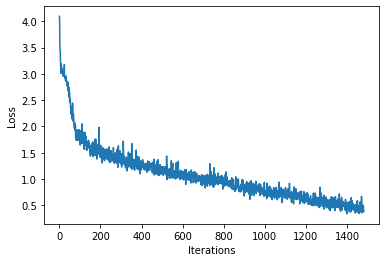

100%|██████████| 1500/1500 [02:06<00:00, 11.86it/s]


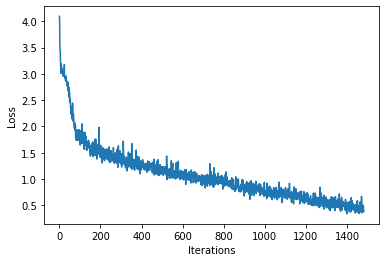

In [ ]:
### Define optimizer and training operation ###

'''TODO: instantiate a new model for training using the `build_model`
  function and the hyperparameters created above.'''
model = build_model(vocab_size, embedding_dim, rnn_units, batch_size)
# model = build_model('''TODO: arguments''')

'''TODO: instantiate an optimizer with its learning rate.
  Checkout the tensorflow website for a list of supported optimizers.
  https://www.tensorflow.org/api_docs/python/tf/keras/optimizers/
  Try using the Adam optimizer to start.'''
optimizer = tf.keras.optimizers.Adam(learning_rate)
# optimizer = # TODO

@tf.function
def train_step(x, y): 
  # Use tf.GradientTape()
  with tf.GradientTape() as tape:
  
    '''TODO: feed the current input into the model and generate predictions'''
    y_hat = model(x) # TODO
    # y_hat = model('''TODO''')
  
    '''TODO: compute the loss!'''
    loss = compute_loss(y, y_hat) # TODO
    # loss = compute_loss('''TODO''', '''TODO''')

  # Now, compute the gradients 
  '''TODO: complete the function call for gradient computation. 
      Remember that we want the gradient of the loss with respect all 
      of the model parameters. 
      HINT: use `model.trainable_variables` to get a list of all model
      parameters.'''
  grads = tape.gradient(loss, model.trainable_variables) # TODO
  # grads = tape.gradient('''TODO''', '''TODO''')
  
  # Apply the gradients to the optimizer so it can update the model accordingly
  optimizer.apply_gradients(zip(grads, model.trainable_variables))
  return loss

##################
# Begin training!#
##################

history = []
plotter = mdl.util.PeriodicPlotter(sec=2, xlabel='Iterations', ylabel='Loss')
if hasattr(tqdm, '_instances'): tqdm._instances.clear() # clear if it exists

for iter in tqdm(range(num_training_iterations)):

  # Grab a batch and propagate it through the network
  x_batch, y_batch = get_batch(vectorized_songs, seq_length, batch_size)
  loss = train_step(x_batch, y_batch)

  # Update the progress bar
  history.append(loss.numpy().mean())
  plotter.plot(history)

  # Update the model with the changed weights!
  if iter % 100 == 0:     
    model.save_weights(checkpoint_prefix)
    
# Save the trained model and the weights
model.save_weights(checkpoint_prefix)


In [ ]:
'''TODO: Rebuild the model using a batch_size=1'''
model = build_model(vocab_size, embedding_dim, rnn_units, batch_size=1) # TODO
# model = build_model('''TODO''', '''TODO''', '''TODO''', batch_size=1)

# Restore the model weights for the last checkpoint after training
model.load_weights(tf.train.latest_checkpoint(checkpoint_dir))
model.build(tf.TensorShape([1, None]))

model.summary()

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_20 (Embedding)    (1, None, 256)            15360     
                                                                 
 lstm_20 (LSTM)              (1, None, 1024)           5246976   
                                                                 
 dense_20 (Dense)            (1, None, 60)             61500     
                                                                 
Total params: 5,323,836
Trainable params: 5,323,836
Non-trainable params: 0
_________________________________________________________________


In [ ]:
### Prediction of a generated song ###

def generate_text(model, start_string, generation_length=1000):
  # Evaluation step (generating ABC text using the learned RNN model)

  '''TODO: convert the start string to numbers (vectorize)'''
  input_eval = [char2idx[s] for s in start_string] # TODO
  # input_eval = ['''TODO''']
  input_eval = tf.expand_dims(input_eval, 0)

  # Empty string to store our results
  text_generated = []

  # Here batch size == 1
  model.reset_states()
  tqdm._instances.clear()

  for i in tqdm(range(generation_length)):
      '''TODO: evaluate the inputs and generate the next character predictions'''
      predictions = model(input_eval)
      # predictions = model('''TODO''')
      
      # Remove the batch dimension
      predictions = tf.squeeze(predictions, 0)
      
      '''TODO: use a multinomial distribution to sample'''
      predicted_id = tf.random.categorical(predictions, num_samples=1)[-1,0].numpy()
      # predicted_id = tf.random.categorical('''TODO''', num_samples=1)[-1,0].numpy()
      
      # Pass the prediction along with the previous hidden state
      #   as the next inputs to the model
      input_eval = tf.expand_dims([predicted_id], 0)
      
      '''TODO: add the predicted character to the generated text!'''
      # Hint: consider what format the prediction is in vs. the output
      text_generated.append(idx2char[predicted_id]) # TODO 
      # text_generated.append('''TODO''')
    
  return (start_string + ''.join(text_generated))

In [ ]:
'''TODO: Use the model and the function defined above to generate ABC format text of length 1000!
    As you may notice, ABC files start with "X" - this may be a good start string.'''
generated_text = generate_text(model, start_string="K:G minor", generation_length=1000) # TODO  #전처리했기 떄문에 X도 수정 필요 >> K로 바꿈
# generated_text = generate_text('''TODO''', start_string="X", generation_length=1000)

100%|██████████| 1000/1000 [00:05<00:00, 167.38it/s]


In [ ]:
#generated_text = generated_text[17:]

In [ ]:
generated_text ='X:1\n' + generated_text

In [ ]:
generated_text

'X:1\nK:G minor\nC|DGG BGG|dGG BGG|DFA cBA|ege dcA|!\nGFG BGB|DGB c2B|DEF G2A|BGE E2:|!\ne|eAA eAf|gfe dBG|ABA AGA|BGE E2:|!\n\nK:A Dorian\ngfe|dcBAGG2E G3E|D2DE G3G|FDEF GABG|!\nABcA GEE2|D2GE DEGA|BAGA Bdef|gedB G3:|!\nB|dgg^f gdBd|gdBd eAA2|gedB GBdg|e2AB AGEG|!\ng3B BdBG|DEGA B3d|ABde fgge|dBAB G2|]!\n\nK:D Major\nzA|d2AF G2AB|d2ef gfed|d2cA GEEc|(3cde (3fed ^cdef|!\ng2fg edBc|d2ed BAGF|GBAG FDDE|FGAF DFA:|!\nf2ec d2g2|e2g2 efge|d2eg fage|d2de fde|]!\n\nK:G Major\nA2B2 G2DB,d,|G,3/G EGA|DGF EGF|!\nEDE D2B|AGE Bcd|edB gfe|d3 d2:|!\ng|fdd gdB|e3 def|g3 gfe|dBG ABc|!\nded fed|ecA ABG|FDF GFG|AdF FGF:|!\nEGB e2f|gag fde|ABc def|ged cA:|!\n\nK:A Dorian\nAB|cde edB|c2E EGE|AGE DB,D|E3 BGE|!\nA3 efe|dAG AGA|cAG FGE|DED D2:|!\nB|ADD B3d|cAGE|FDdD|EDCD D3:|!\nA|d2Ad d2GB|A2dA Adef|g2fd edcB|cdef gece|!\nd2fd Adfe|defg afge|ABcd edce|fdcA BG:|!\n\nK:D Mixolydian\nD|FDFG A3G|FDAD EDDE|G2AB c2cB|ABAG FDD^F|!\nG2DG BGBd|g2df ecAF|GFGB Adce|d2e^c d2:|!\nef|gdBd gdBG|FcAc FGAc|BGdG BGAg|fgaf gedf

In [ ]:
### Play back generated songs ###

generated_songs = mdl.lab1.extract_song_snippet(generated_text)

for i, song in enumerate(generated_songs): 
  # Synthesize the waveform from a song
  waveform = mdl.lab1.play_song(song)

  # If its a valid song (correct syntax), lets play it! 
  if waveform:
    print("Generated song", i)
    ipythondisplay.display(waveform)

Found 6 songs in text
Generated song 0


In [ ]:
### Play back generated songs ###

generated_songs = mdl.lab1.extract_song_snippet(generated_text)

for i, song in enumerate(generated_songs): 
  # Synthesize the waveform from a song
  waveform = mdl.lab1.play_song(song)

  # If its a valid song (correct syntax), lets play it! 
  if waveform:
    print("Generated song", i)
    ipythondisplay.display(waveform)

Found 5 songs in text
Generated song 0
